In [1]:
# Install the Roboflow Python package
!pip install roboflow

# Install the Ultralytics package, which provides YOLO and related computer vision tools
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 322.4/322.4 kB 11.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.4/5.4 MB 44.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.4/58.4 kB 4.2 MB/s eta 0:00:00
  Attempting uninstall: typer
    Found existing installation: typer 0.27.2
    Uninstalling typer-0.27.2:
      Successfully uninstalled typer-0.27.2
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.7/46.7 kB 3.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 33.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.0/88.0 kB 10.2 MB/s eta 0:00:00


In [2]:
# Import the Roboflow class from the Roboflow package
from roboflow import Roboflow

# Initialize Roboflow using your API key
# Replace the API key below with your own Roboflow API key
rf = Roboflow(api_key="")

In [3]:
import os
import yaml
import glob

# ============================================================
# 1. Rename Classes in a YOLO Dataset
# ============================================================

def rename_classes(dataset_location, class_renames):
    """
    Rename YOLO class names in a downloaded dataset's data.yaml.

    Parameters
    ----------
    dataset_location : str
        Path returned by dataset.location.

    class_renames : dict
        Mapping of old class names to new class names.
        Example:
            {
                "objects": "object",
                "1": "person",
                "screen_IVI": "screen"
            }
    """

    # --------------------------------------------------------
    # Locate the dataset's data.yaml file
    # --------------------------------------------------------

    yaml_path = os.path.join(dataset_location, "data.yaml")

    if not os.path.exists(yaml_path):
        raise FileNotFoundError(f"data.yaml not found at: {yaml_path}")

    # --------------------------------------------------------
    # Load the YAML configuration
    # --------------------------------------------------------

    # Load YAML
    with open(yaml_path, "r") as f:
        data = yaml.safe_load(f)

    # Extract the list of class names.
    names = data.get("names", [])

    # --------------------------------------------------------
    # Handle Different YOLO Class Name Formats
    # --------------------------------------------------------

    # Handle both:
    # names: ["laptop", "face"]
    # and
    # names: {0: "laptop", 1: "face"}
    if isinstance(names, dict):
        names = [names[i] for i in sorted(names.keys())]

    old_names = names.copy()

    # --------------------------------------------------------
    # Rename Classes
    # --------------------------------------------------------

    # Rename classes
    names = [
        class_renames.get(name, name)
        for name in names
    ]

    # --------------------------------------------------------
    # Update the YAML Configuration
    # --------------------------------------------------------

    # Update YAML
    data["names"] = names
    data["nc"] = len(names)

    with open(yaml_path, "w") as f:
        yaml.dump(data, f, sort_keys=False)

    # --------------------------------------------------------
    # Display the Changes
    # --------------------------------------------------------

    print(f"\nClass names updated: {dataset_location}")
    print("Before:", old_names)
    print("After: ", names)

# ============================================================
# 2. Delete Classes from a YOLO Dataset
# ============================================================

def delete_classes(dataset_location, classes_to_delete):
    """
    Delete classes from a YOLO dataset.

    Parameters
    ----------
    dataset_location : str
        Path returned by dataset.location.

    classes_to_delete : list
        List of class names to delete.

        Example:
            ["objects", "face"]

    This function:
        - Removes the classes from data.yaml
        - Removes their annotations from .txt files
        - Remaps the remaining class IDs
        - Leaves the images untouched
    """

    # --------------------------------------------------------
    # Locate the dataset's data.yaml file
    # --------------------------------------------------------

    yaml_path = os.path.join(dataset_location, "data.yaml")

    if not os.path.exists(yaml_path):
        raise FileNotFoundError(
            f"data.yaml not found at: {yaml_path}"
        )

    # --------------------------------------------------------
    # Load YAML Configuration
    # --------------------------------------------------------

    # Load YAML
    with open(yaml_path, "r") as f:
        data = yaml.safe_load(f)

    # Extract the list of class names.
    names = data.get("names", [])

    # --------------------------------------------------------
    # Handle Dictionary-Formatted Class Names
    # --------------------------------------------------------

    # Handle dict format:
    # {0: "laptop", 1: "face"}
    if isinstance(names, dict):
        names = [names[i] for i in sorted(names.keys())]

    # --------------------------------------------------------
    # Display Original Classes
    # --------------------------------------------------------

    print("\nOriginal classes:")
    for i, name in enumerate(names):
        print(f"  {i}: {name}")

    # --------------------------------------------------------
    # Find Class IDs to Delete
    # --------------------------------------------------------

    # Find IDs that should be deleted
    delete_ids = {
        i for i, name in enumerate(names)
        if name in classes_to_delete
    }

    # --------------------------------------------------------
    # Check for Missing Class Names
    # --------------------------------------------------------

    # Check that requested classes exist
    missing = set(classes_to_delete) - set(names)

    if missing:
        print(f"\nWARNING: Classes not found: {sorted(missing)}")

    if not delete_ids:
        print("\nNo classes deleted.")
        return

    # --------------------------------------------------------
    # Create Old-Class-ID -> New-Class-ID Mapping
    # --------------------------------------------------------

    # Create mapping from old ID -> new ID
    #
    # Example:
    # old:
    # 0 laptop
    # 1 objects  <- delete
    # 2 face
    #
    # new:
    # 0 laptop
    # 1 face
    #
    id_mapping = {}

    # This list will contain the remaining class names.
    new_names = []

    # Process every original class.
    for old_id, name in enumerate(names):

        # Skip classes that should be deleted.
        if old_id in delete_ids:
            continue

        # Assign the next available class ID.
        new_id = len(new_names)

        # Store the mapping from old ID to new ID.
        id_mapping[old_id] = new_id

        # Add the class name to the new class list.
        new_names.append(name)

    # --------------------------------------------------------
    # Display Classes Being Deleted
    # --------------------------------------------------------

    print("\nDeleting:")
    for class_id in sorted(delete_ids):
        print(f"  {class_id}: {names[class_id]}")

    # --------------------------------------------------------
    # Display Remaining Classes
    # --------------------------------------------------------

    print("\nNew classes:")
    for i, name in enumerate(new_names):
        print(f"  {i}: {name}")

    # ---------------------------------------------------------
    # Update all YOLO label files
    # ---------------------------------------------------------

    label_files = glob.glob(
        os.path.join(dataset_location, "**", "labels", "*.txt"),
        recursive=True
    )

    modified_files = 0
    deleted_annotations = 0

    # --------------------------------------------------------
    # Process Each Label File
    # --------------------------------------------------------

    for label_path in label_files:

        # Read the original YOLO annotations.
        with open(label_path, "r") as f:
            lines = f.readlines()

        new_lines = []

        # Process each annotation line.
        for line in lines:

            # Split the line into individual values.
            parts = line.strip().split()

            # Ignore empty lines.
            if not parts:
                continue

            # The first value is the original class ID.
            old_class_id = int(parts[0])

            # ------------------------------------------------
            # Delete Annotations for Removed Classes
            # ------------------------------------------------

            # Delete annotations belonging to deleted classes
            if old_class_id in delete_ids:
                deleted_annotations += 1
                continue

            # ------------------------------------------------
            # Remap Remaining Class IDs
            # ------------------------------------------------

            # Remap remaining class ID
            new_class_id = id_mapping[old_class_id]

            # Keep the bounding-box coordinates unchanged.
            new_line = (
                f"{new_class_id} "
                + " ".join(parts[1:])
                + "\n"
            )

            # Add the updated annotation to the new label list.
            new_lines.append(new_line)

        # ----------------------------------------------------
        # Save Updated Label File
        # ----------------------------------------------------

        # Write updated labels
        with open(label_path, "w") as f:
            f.writelines(new_lines)

        modified_files += 1

    # ---------------------------------------------------------
    # Update data.yaml
    # ---------------------------------------------------------

    data["names"] = new_names
    data["nc"] = len(new_names)

    with open(yaml_path, "w") as f:
        yaml.dump(data, f, sort_keys=False)

    # ========================================================
    # Display Final Results
    # ========================================================

    print("\nSUCCESS!")
    print(f"Dataset: {dataset_location}")
    print(f"Label files processed: {modified_files}")
    print(f"Annotations deleted: {deleted_annotations}")
    print(f"Remaining classes: {len(new_names)}")

In [4]:
# ==============================
# Download Face Dataset
# ==============================

# Access the Face dataset project from the specified Roboflow workspace
project = rf.workspace("ce7454-zxmnp").project("better_faces_and_plates")

# Select version 1 of the dataset
version = project.version(1)

# Download the dataset in YOLOv8 format
dataset = version.download("yolov8")

# Rename the "face" class to "Face"
rename_classes(dataset.location, {"face": "Face"})

# Rename the original "1" class to "Car Number Plate"
rename_classes(dataset.location, {"1": "Car Number Plate"})

# Display the location where the dataset was downloaded
print(f"SUCCESS! Dataset downloaded to: {dataset.location}\n")

# ==============================
# Download Display Monitor Dataset
# ==============================

# Access the Display Monitor dataset project
project = rf.workspace("home-8o6uy").project("screen-zrnbp")

# Select version 1 of the dataset
version = project.version(1)

# Download the dataset in YOLOv8 format
dataset = version.download("yolov8")

# Rename the original "screen_IVI" class to "Display Monitor"
rename_classes(dataset.location, {"screen_IVI": "Display Monitor"})

# Display the location where the dataset was downloaded
print(f"SUCCESS! Dataset downloaded to: {dataset.location}\n")

# ==============================
# Download Medicine Dataset
# ==============================

# Access the Medicine dataset project
project = rf.workspace("fashion-5aawk").project("medicine-uyag5")

# Select version 3 of the dataset
version = project.version(3)

# Download the dataset in YOLOv8 format
dataset = version.download("yolov8")

# Rename the "medicine_pack" class to "Medicine"
rename_classes(dataset.location, {"medicine_pack": "Medicine"})

# Display the location where the dataset was downloaded
print(f"SUCCESS! Dataset downloaded to: {dataset.location}\n")

# ==============================
# Download ID Card Dataset
# ==============================

# Access the ID Card dataset project
project = rf.workspace("ai-b8pvg").project("id-card-l8shn")

# Select version 1 of the dataset
version = project.version(1)

# Download the dataset in YOLOv8 format
dataset = version.download("yolov8")

# Rename the "id-card" class to "ID Card"
rename_classes(dataset.location, {"id-card": "ID Card"})

# Display the location where the dataset was downloaded
print("\nSUCCESS! Dataset downloaded to:", dataset.location)

# ==============================
# Download Credit / Debit Card Dataset
# ==============================

# Access the Credit / Debit Card dataset project
project = rf.workspace("son-bqkqd").project("privacy_card")

# Select version 1 of the dataset
version = project.version(1)

# Download the dataset in YOLOv8 format
dataset = version.download("yolov8")

# Rename the "card" class to "Credit / Debit Card"
rename_classes(dataset.location, {"card": "Credit / Debit Card"})

# Display the location where the dataset was downloaded
print("\nSUCCESS! Dataset downloaded to:", dataset.location)

# ==============================
# Download Laptop Dataset
# ==============================

# Access the Laptop dataset project from the specified Roboflow workspace
project = rf.workspace("geodesy").project("laptop-model-gqgxm")

# Select version 1 of the dataset
version = project.version(1)

# Download the dataset in YOLOv8 format
dataset = version.download("yolov8")

# Display the location where the dataset was downloaded
print(f"SUCCESS! Dataset downloaded to: {dataset.location}\n")

# ==============================
# Download Document Dataset
# ==============================

# Access the Document dataset project
project = rf.workspace("mass-j71q8").project("paper-eo0fq")

# Select version 1 of the dataset
version = project.version(1)

# Download the dataset in YOLOv8 format
dataset = version.download("yolov8")

# Rename the "paper" class to "Document"
rename_classes(dataset.location, {"paper": "Document"})

# Display the location where the dataset was downloaded
print("\nSUCCESS! Dataset downloaded to:", dataset.location)

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to better_faces_and_plates-1 in yolov8:: 100%|██████████| 4502/4502 [00:01<00:00, 3484.52it/s]


Creating new Ultralytics Settings v0.0.8 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/usage/settings.

Class names updated: /content/better_faces_and_plates-1
Before: ['1', 'face']
After:  ['1', 'Face']

Class names updated: /content/better_faces_and_plates-1
Before: ['1', 'Face']
After:  ['Car Number Plate', 'Face']
SUCCESS! Dataset downloaded to: /content/better_faces_and_plates-1

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to screen-1 in yolov8:: 100%|██████████| 1932/1932 [00:00<00:00, 8020.46it/s]


Class names updated: /content/screen-1
Before: ['screen_IVI']
After:  ['Display Monitor']
SUCCESS! Dataset downloaded to: /content/screen-1

loading Roboflow workspace...


loading Roboflow project...



Extracting Dataset Version Zip to medicine-3 in yolov8:: 100%|██████████| 733/733 [00:00<00:00, 1245.11it/s]



Class names updated: /content/medicine-3
Before: ['medicine_pack']
After:  ['Medicine']
SUCCESS! Dataset downloaded to: /content/medicine-3

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to id-card-1 in yolov8:: 100%|██████████| 212/212 [00:00<00:00, 10960.63it/s]


Class names updated: /content/id-card-1
Before: ['id-card']
After:  ['ID Card']

SUCCESS! Dataset downloaded to: /content/id-card-1
loading Roboflow workspace...


loading Roboflow project...



Extracting Dataset Version Zip to privacy_card-1 in yolov8:: 100%|██████████| 552/552 [00:00<00:00, 8578.04it/s]


Class names updated: /content/privacy_card-1
Before: ['card']
After:  ['Credit / Debit Card']

SUCCESS! Dataset downloaded to: /content/privacy_card-1
loading Roboflow workspace...


loading Roboflow project...



Extracting Dataset Version Zip to Laptop-Model-1 in yolov8:: 100%|██████████| 61/61 [00:00<00:00, 8076.15it/s]

SUCCESS! Dataset downloaded to: /content/Laptop-Model-1

loading Roboflow workspace...


loading Roboflow project...



Extracting Dataset Version Zip to Paper-1 in yolov8:: 100%|██████████| 135/135 [00:00<00:00, 7484.19it/s]


Class names updated: /content/Paper-1
Before: ['paper']
After:  ['Document']

SUCCESS! Dataset downloaded to: /content/Paper-1


In [5]:
# Import the required Python libraries
import os          # Used for working with directories and file paths
import glob        # Used to find files matching specific patterns
import yaml        # Used to read and write YAML configuration files
import shutil      # Used to copy files

# ============================================================
# 1. Define Source Dataset Information
# ============================================================

# Store the name and location of the data.yaml file
# for each individual dataset.
datasets_info = [
    {"name": "better_faces_and_plates-1", "yaml": "/content/better_faces_and_plates-1/data.yaml"},
    {"name": "screen-1", "yaml": "/content/screen-1/data.yaml"},
    {"name": "medicine-3", "yaml": "/content/medicine-3/data.yaml"},
    {"name": "id-card-1", "yaml": "/content/id-card-1/data.yaml"},
    {"name": "privacy_card-1", "yaml": "/content/privacy_card-1/data.yaml"},
    {"name": "Laptop-Model-1", "yaml": "/content/Laptop-Model-1/data.yaml"},
    {"name": "Paper-1", "yaml": "/content/Paper-1/data.yaml"}
]

# ============================================================
# Create Unified Dataset Directory Structure
# ============================================================

# Define the location where all datasets will be merged
unified_dir = "/content/unified_dataset"

# Create separate folders for training, validation, and testing
# Each split contains an images folder and a labels folder.
for split in ["train", "valid", "test"]:
  os.makedirs(f"{unified_dir}/{split}/images", exist_ok=True)
  os.makedirs(f"{unified_dir}/{split}/labels", exist_ok=True)

# Store the final list of unique class names from all datasets
all_class_names = []

# Store the mapping between the original class IDs
# and the new unified class IDs.
#
# Example:
# {
#     "Laptop-Model-1": {0: 1},
#     "medicine-3": {0: 5}
# }
class_mappings = {}  # {dataset_name: {old_id: new_id}}

# ============================================================
# 2. Build Unified Class List and Class ID Mappings
# ============================================================

# Process every dataset one by one
for d in datasets_info:

  # Open the dataset's data.yaml file
  with open(d["yaml"], "r") as f:
    data = yaml.safe_load(f)

  # Get the class names from the YAML file
  names = data.get("names", [])

  # Handle names formatted as dict {0: 'a', 1: 'b'} or list ['a', 'b']
  # Some YOLO datasets store class names as a dictionary:
  # {0: "face", 1: "person"}
  #
  # Others store them as a list:
  # ["face", "person"]
  #
  # Convert dictionaries into a list for consistent processing.
  if isinstance(names, dict):
    names = [names[i] for i in sorted(names.keys())]

  # Create a mapping between the original class IDs
  # and the new unified class IDs.
  mapping = {}

  # Go through every class in the current dataset
  for old_id, name in enumerate(names):
    if name not in all_class_names:
      all_class_names.append(name)
    mapping[old_id] = all_class_names.index(name)

  class_mappings[d["name"]] = mapping

# Display the final unified list of classes
print(f"Total Unified Classes ({len(all_class_names)}): {all_class_names}")

# ============================================================
# 3. Copy Images and Remap Labels
# ============================================================

# Process every dataset
for d in datasets_info:

  # Get the dataset name
  d_name = d["name"]

  # Get the class ID mapping created in the previous step
  mapping = class_mappings[d_name]

  # Process training, validation, and testing data
  for split in ["train", "valid", "test"]:

    # Define the image and label directories
    img_dir = f"/content/{d_name}/{split}/images"
    lbl_dir = f"/content/{d_name}/{split}/labels"

    # If the image directory does not exist,
    # skip this dataset split.
    if not os.path.exists(img_dir):
      continue

    # Find all supported image files
    img_files = (
        glob.glob(f"{img_dir}/*.jpg")
        + glob.glob(f"{img_dir}/*.png")
        + glob.glob(f"{img_dir}/*.jpeg")
    )

    # Process each image
    for img_path in img_files:
      filename = os.path.basename(img_path)
      base_name = os.path.splitext(filename)[0]
      lbl_path = f"{lbl_dir}/{base_name}.txt"

      # Prefix filenames to prevent naming collisions (e.g., pill_001.jpg vs desk_001.jpg)
      # ----------------------------------------------------
      # Prevent Filename Collisions
      # ----------------------------------------------------

      # Add the dataset name to the filename.
      #
      # For example:
      # image001.jpg
      #
      # becomes:
      # Laptop-Model-1_image001.jpg
      #
      # This prevents two datasets from overwriting files
      # with the same filename.
      new_img_name = f"{d_name}_{filename}"
      new_lbl_name = f"{d_name}_{base_name}.txt"

      # ----------------------------------------------------
      # Copy Image to Unified Dataset
      # ----------------------------------------------------

      # Copy the original image into the appropriate
      # unified train/valid/test images directory.
      shutil.copy(img_path, f"{unified_dir}/{split}/images/{new_img_name}")

      # ----------------------------------------------------
      # Remap YOLO Class IDs
      # ----------------------------------------------------

      # Remap and write Label file
      new_lines = []
      if os.path.exists(lbl_path):

        # Read the original YOLO annotation file.
        with open(lbl_path, "r") as lf:
          lines = lf.readlines()

        # Process each annotation.
        for line in lines:

          # Split the annotation into individual values.
          parts = line.strip().split()

          # Ignore empty lines.
          if not parts:
            continue

          # The first value is the original class ID.
          old_cls = int(parts[0])

          # Check that the class ID exists in the mapping.
          if old_cls in mapping:

            # Convert the original class ID to the
            # corresponding unified class ID.
            new_cls = mapping[old_cls]

            # Keep the bounding-box coordinates unchanged
            # and replace only the class ID.
            new_lines.append(f"{new_cls} " + " ".join(parts[1:]) + "\n")

      # ----------------------------------------------------
      # Write the Updated Label File
      # ----------------------------------------------------

      with open(f"{unified_dir}/{split}/labels/{new_lbl_name}", "w") as nlf:
        nlf.writelines(new_lines)

# ============================================================
# 4. Create the Master data.yaml File
# ============================================================

# Create a new YAML configuration for the unified dataset.
#
# This file tells YOLO where the images are located and
# which classes are available.
unified_yaml = {
    "path": unified_dir,
    "train": "train/images",
    "val": "valid/images",
    "test": "test/images",
    "nc": len(all_class_names),
    "names": all_class_names,
}

# Write the unified configuration to data.yaml.
with open(f"{unified_dir}/data.yaml", "w") as f:
  yaml.dump(unified_yaml, f)

# ============================================================
# 5. Display Completion Message
# ============================================================

print(
    "Merging complete! Unified data.yaml created at"
    " /content/unified_dataset/data.yaml"
)

Total Unified Classes (8): ['Car Number Plate', 'Face', 'Display Monitor', 'Medicine', 'ID Card', 'Credit / Debit Card', 'Laptop', 'Document']
Merging complete! Unified data.yaml created at /content/unified_dataset/data.yaml


In [6]:
# Import the YOLO class from the Ultralytics library
from ultralytics import YOLO

# ============================================================
# Load Pre-trained YOLOv8 Model
# ============================================================

# Load the pre-trained YOLOv8 Nano model.
# The "n" stands for Nano, which is a lightweight model
# designed for faster training and inference.
#
# The model starts with weights that were already trained
# on a large dataset and will be fine-tuned on our
# unified custom dataset.
model = YOLO('yolov8n.pt')

# ============================================================
# Train the Model on the Unified Dataset
# ============================================================

# Train the YOLOv8 model using all classes in the
# unified dataset.
results = model.train(
    data='/content/unified_dataset/data.yaml',
    epochs=200,
    imgsz=640,
    batch=16,
    name='privacy_unified_all_classes',
)

Ultralytics 8.4.157 🚀 Python-3.13.15 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, channels_last=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/unified_dataset/data.yaml, degrees=0.0, deterministic=True, device=, dfl=1.5, dgrad=0.5, dis=6.0, distill_model=None, dlam=1.0, dlog=1.0, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=200, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=privacy_unified_all_classes, nbs=64, nms=


image 1/1 /content/better_faces_and_plates-1/test/images/13_Interview_Interview_2_People_Visible_13_327_jpg.rf.cf00de025ac4eac04d9334f6e4128eb8.jpg: 640x640 2 Faces, 9.1ms
Speed: 1.8ms preprocess, 9.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


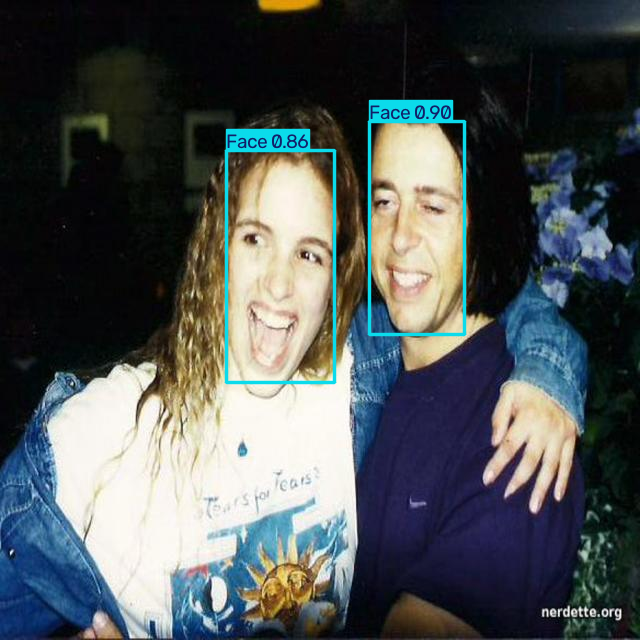


image 1/1 /content/better_faces_and_plates-1/test/images/58_Hockey_icehockey_puck_58_653_jpg.rf.e49a0ad800a53384883a40831a50df56.jpg: 640x640 5 Faces, 34.4ms
Speed: 2.9ms preprocess, 34.4ms inference, 6.4ms postprocess per image at shape (1, 3, 640, 640)


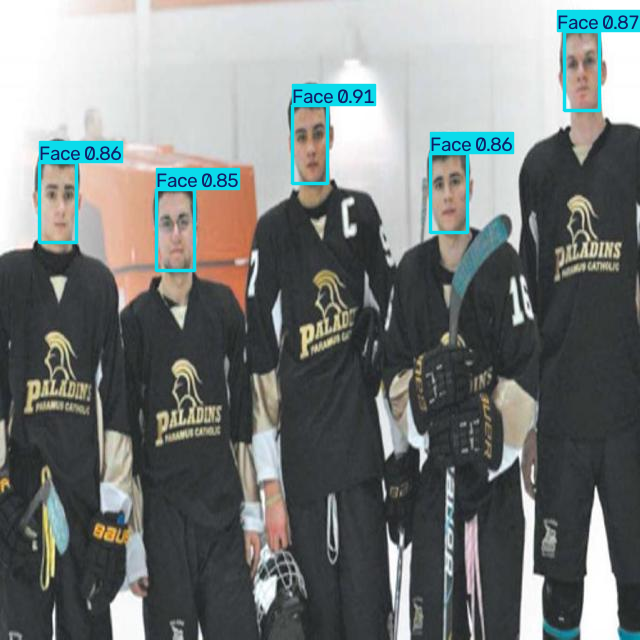


image 1/1 /content/screen-1/test/images/1702460997677_jpg.rf.e909f95e98d340e72d4e11d0adff426f.jpg: 640x640 1 Display Monitor, 8.6ms
Speed: 1.0ms preprocess, 8.6ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


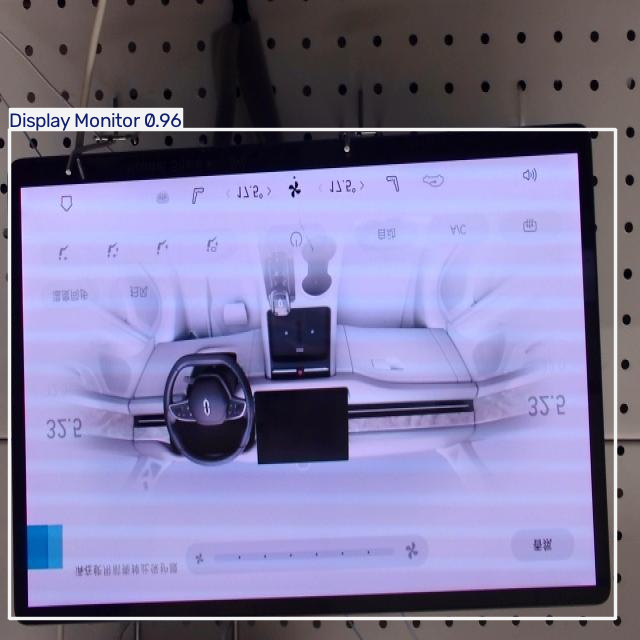


image 1/1 /content/screen-1/test/images/1702460895314_jpg.rf.83d3e90794072bba1f0096694ff40bb1.jpg: 640x640 1 Display Monitor, 12.5ms
Speed: 3.1ms preprocess, 12.5ms inference, 3.9ms postprocess per image at shape (1, 3, 640, 640)


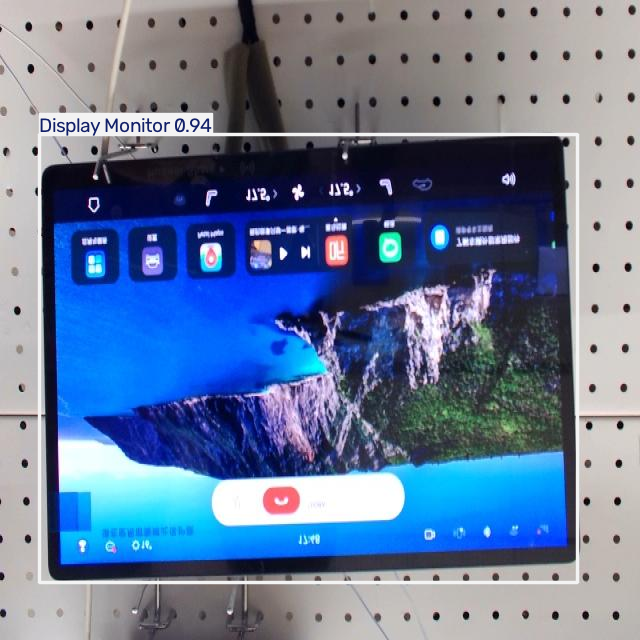


image 1/1 /content/screen-1/test/images/1702462564796_jpg.rf.627834e1a94a76e1868aaca36d33b2e7.jpg: 640x640 1 Display Monitor, 8.7ms
Speed: 1.0ms preprocess, 8.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


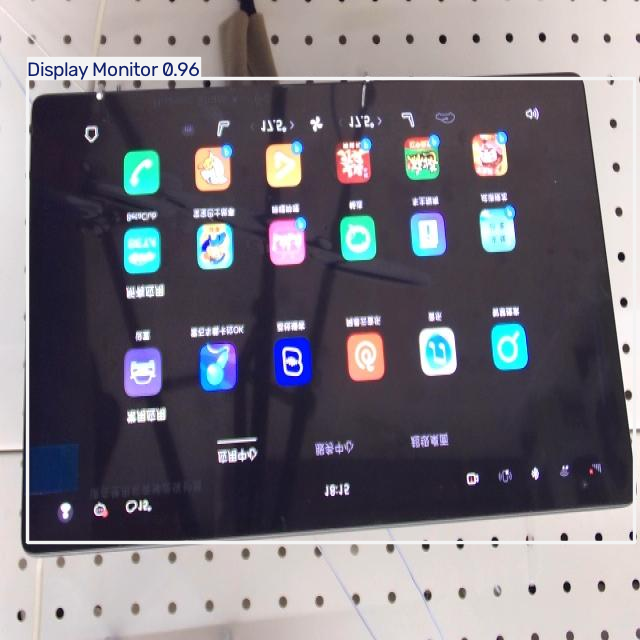


image 1/1 /content/medicine-3/test/images/samsung-a50-291_jpg.rf.8edb845d8a6b156c405afdf306b29ee4.jpg: 384x640 1 Medicine, 11.0ms
Speed: 2.9ms preprocess, 11.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)


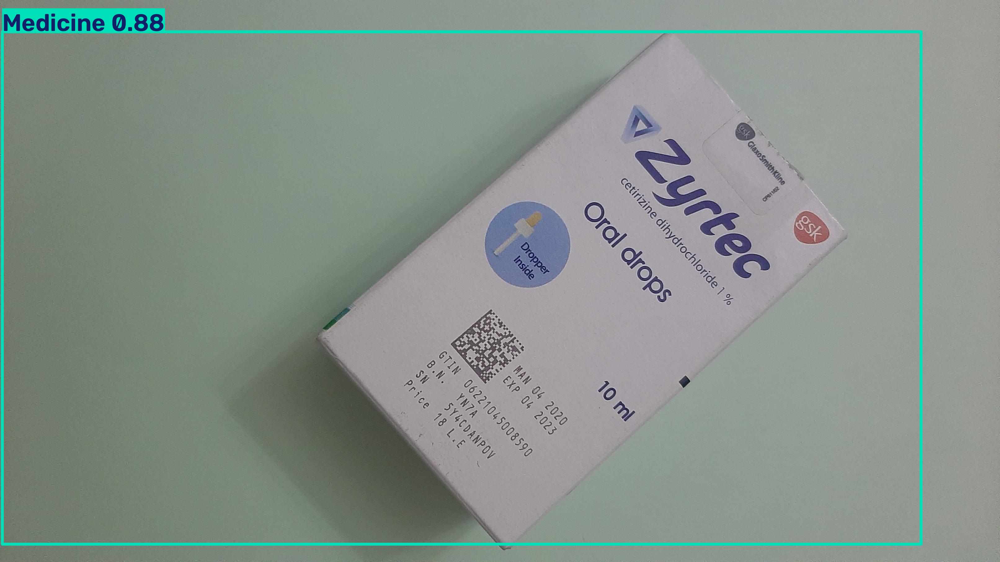


image 1/1 /content/id-card-1/test/images/40_jpg.rf.bb872eaeb2106883bfa6b6922fa94346.jpg: 640x640 1 ID Card, 12.1ms
Speed: 1.1ms preprocess, 12.1ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


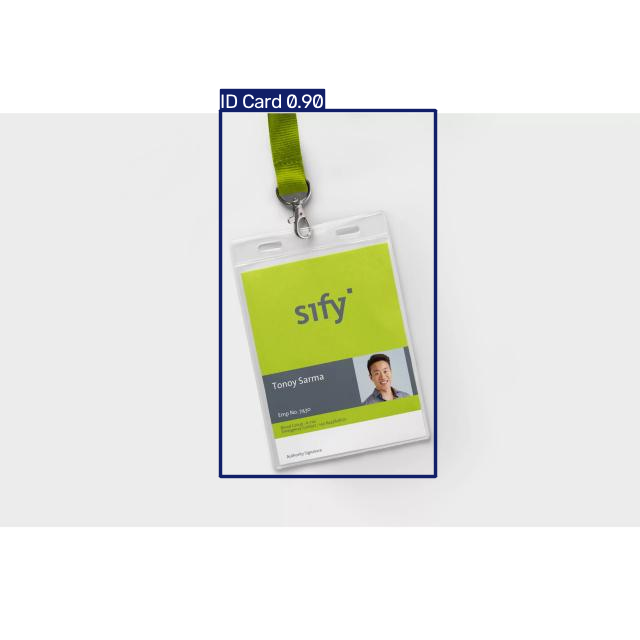


image 1/1 /content/privacy_card-1/test/images/IMG-20220602-WA0163_jpg.rf.9efaed559c16b664dc971dfcafd1de9b.jpg: 640x640 1 Credit / Debit Card, 8.6ms
Speed: 0.9ms preprocess, 8.6ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


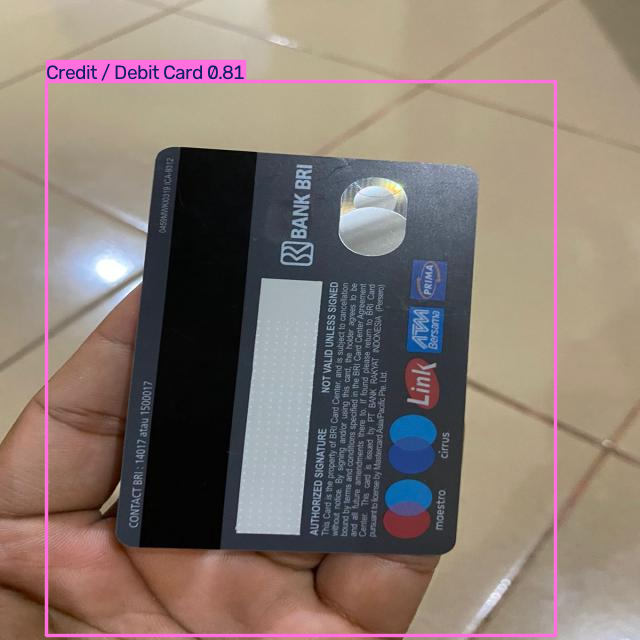


image 1/1 /content/privacy_card-1/test/images/IMG-20220602-WA0266_jpg.rf.8ac567ca3f4ce06064b3cf6b9a6377ca.jpg: 640x640 1 Credit / Debit Card, 8.2ms
Speed: 1.0ms preprocess, 8.2ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


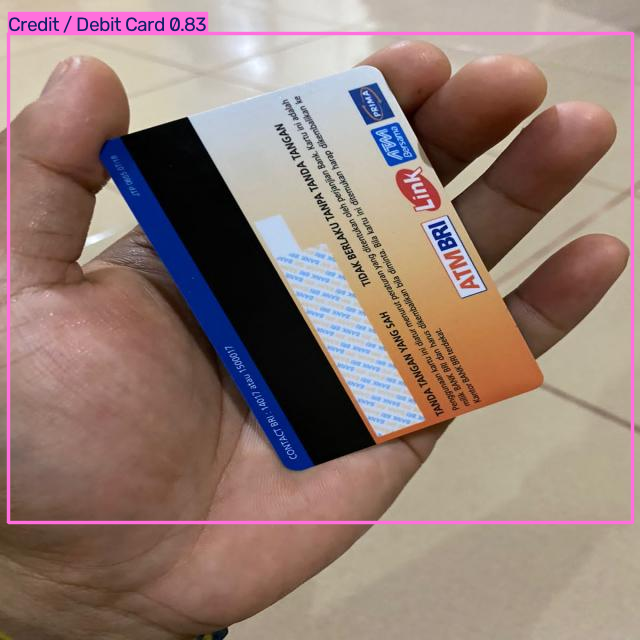


image 1/1 /content/privacy_card-1/test/images/IMG-20220602-WA0182_jpg.rf.842a7aca3c4886a2aaf401caec23d423.jpg: 640x640 1 Credit / Debit Card, 10.4ms
Speed: 1.0ms preprocess, 10.4ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


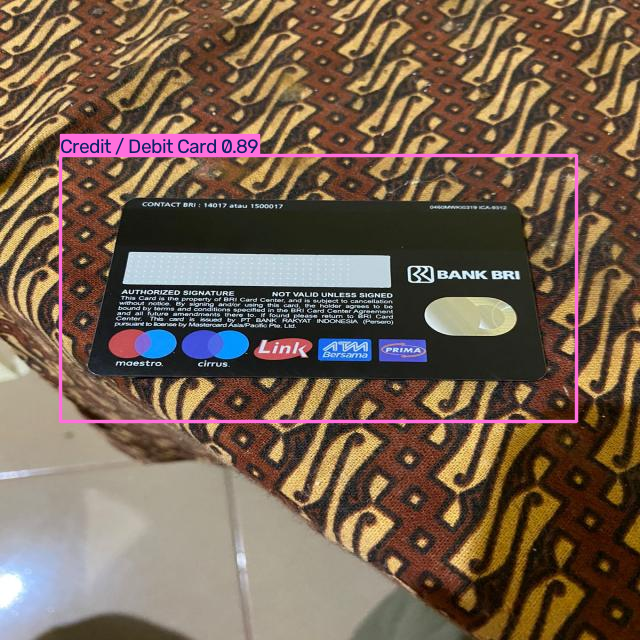


image 1/1 /content/Laptop-Model-1/test/images/images_jpg.rf.9ca0d779bd173829f4d23c5b734ad3fe.jpg: 640x640 1 Laptop, 9.6ms
Speed: 1.0ms preprocess, 9.6ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)


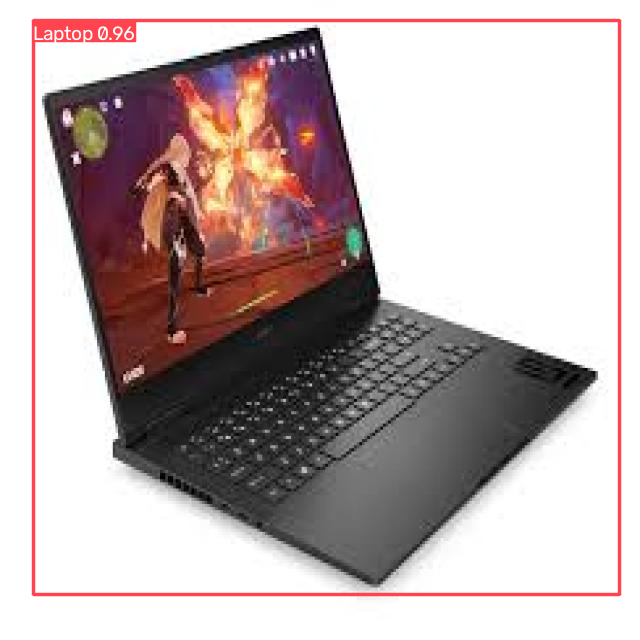


image 1/1 /content/Paper-1/test/images/data3_aug_7_png.rf.b5ab0b3758b6b17137d7441c28131328.jpg: 640x640 1 Document, 11.1ms
Speed: 2.0ms preprocess, 11.1ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


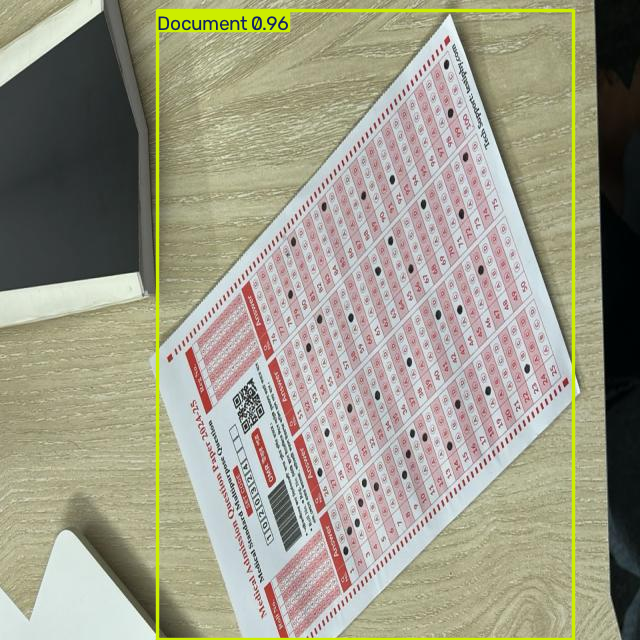

In [14]:
import glob
from ultralytics import YOLO
from google.colab.patches import cv2_imshow

# ============================================================
# 1. Load the Trained YOLO Model
# ============================================================

# Load the best-trained model weights.
#
# The "best.pt" file contains the model checkpoint that
# achieved the best validation performance during training.
#
# This model is assumed to be the final model trained on
# the unified dataset containing all required classes.
final_model = YOLO(
    '/content/runs/detect/privacy_unified_all_classes/weights/best.pt'
)

# ============================================================
# 2. Select Sample Test Images
# ============================================================

# Collect sample images from the test set of each dataset.
#
# glob.glob() searches for image files matching the
# specified path pattern.
#
# Different slice ranges are used to select a small number
# of images from each dataset rather than testing every image.
#
# This allows us to visually inspect how the trained model
# performs on images from different source datasets.
test_images = (
    glob.glob('/content/better_faces_and_plates-1/test/images/*.jpg')[9:11]
    + glob.glob('/content/screen-1/test/images/*.jpg')[:3]
    + glob.glob('/content/medicine-3/test/images/*.jpg')[4:5]
    + glob.glob('/content/id-card-1/test/images/*.jpg')[7:8]
    + glob.glob('/content/privacy_card-1/test/images/*.jpg')[:3]
    + glob.glob('/content/Laptop-Model-1/test/images/*.jpg')[1:2]
    + glob.glob('/content/Paper-1/test/images/*.jpg')[2:3]
)

# ============================================================
# 3. Run Object Detection on Each Test Image
# ============================================================

# Process every selected test image one at a time.
for img_path in test_images:

  # Run the trained YOLO model on the current image.
  results = final_model(img_path)

  # --------------------------------------------------------
  # 4. Draw Detection Results on the Image
  # --------------------------------------------------------
  rendered_img = results[0].plot()

  # --------------------------------------------------------
  # 5. Display the Annotated Image
  # --------------------------------------------------------
  cv2_imshow(rendered_img)

In [15]:
from google.colab import drive

# Mount Google Drive to the Colab environment.
# This allows files in Google Drive to be accessed from Colab.
drive.mount('/content/drive')

# ============================================================
# Copy YOLO Prediction Results to Google Drive
# ============================================================

# Copy the complete prediction/training results folder
# from the Colab environment to the YOLO_Results folder
# in Google Drive.
#
# The "-r" option copies the entire directory, including
# all files and subdirectories inside it.
!cp -r /content/runs/detect/privacy_unified_all_classes /content/drive/MyDrive/YOLO_Results

Mounted at /content/drive


In [16]:
import os
import shutil
from google.colab import drive

# ============================================================
# 1. Mount Google Drive
# ============================================================

# Connect Google Drive to the Colab environment.
# After mounting, Google Drive files can be accessed
# through the /content/drive/ directory.
drive.mount('/content/drive')

# ============================================================
# 2. Create a Project Folder in Google Drive
# ============================================================

# Define the location where the YOLO model files and results
# will be stored in Google Drive.
drive_folder = '/content/drive/MyDrive/YOLO_Privacy_Model'
os.makedirs(drive_folder, exist_ok=True)

# ============================================================
# 3. Copy YOLO Training Results to Google Drive
# ============================================================

# Copy the complete YOLO "runs/detect" directory from Colab
# to the project folder in Google Drive.
#
# This directory may contain:
# - Trained model weights such as best.pt and last.pt
# - Training results and metrics
# - Training plots
# - Prediction images
# - Other files generated during training
!cp -r /content/runs/detect/ $drive_folder/

# ============================================================
# 4. Display Completion Message
# ============================================================

print(f"All model weights and prediction images successfully saved to Google Drive at: {drive_folder}")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
All model weights and prediction images successfully saved to Google Drive at: /content/drive/MyDrive/YOLO_Privacy_Model
